<a href="https://colab.research.google.com/github/leanerr/-Ridge-Regression-interpretation-/blob/main/ItalyVaccination.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

# Specify the path to your CSV file
csv_file_path = '/content/italian_vaccination.csv'

# Read CSV using pandas
df = pd.read_csv(csv_file_path)

# Display the pandas DataFrame
print("DataFrame from pandas:")
print(df)

# Access data using NumPy (if needed)
numpy_array = df.to_numpy()
print("\nNumPy array from pandas DataFrame:")
print(numpy_array)


In [ ]:
df.head(1000)

,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name
0,2020-12-27,Moderna,LAZ,40-49,0,1,1,0,0,0,0,0,ITI,ITI4,12,Lazio
1,2020-12-27,Moderna,SIC,90+,0,1,1,0,0,0,0,0,ITG,ITG1,19,Sicilia
2,2020-12-27,Pfizer/BioNTech,ABR,20-29,1,1,2,0,0,0,0,0,ITF,ITF1,13,Abruzzo
3,2020-12-27,Pfizer/BioNTech,ABR,30-39,1,4,5,0,0,0,0,0,ITF,ITF1,13,Abruzzo
4,2020-12-27,Pfizer/BioNTech,ABR,40-49,1,8,9,0,0,0,0,0,ITF,ITF1,13,Abruzzo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2021-01-05,Pfizer/BioNTech,BAS,40-49,98,149,246,0,1,0,0,0,ITF,ITF5,17,Basilicata
996,2021-01-05,Pfizer/BioNTech,BAS,50-59,100,175,274,0,1,0,0,0,ITF,ITF5,17,Basilicata
997,2021-01-05,Pfizer/BioNTech,BAS,60-69,132,105,237,0,0,0,0,0,ITF,ITF5,17,Basilicata
998,2021-01-05,Pfizer/BioNTech,BAS,70-79,5,3,8,0,0,0,0,0,ITF,ITF5,17,Basilicata


In [ ]:
df.tail()


,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name
311107,2023-11-16,Pfizer/BioNTech,TOS,50-59,0,1,0,0,0,0,0,1,ITI,ITI1,9,Toscana
311108,2023-11-16,Pfizer/BioNTech,TOS,60-69,3,2,0,0,0,0,0,5,ITI,ITI1,9,Toscana
311109,2023-11-16,Pfizer/BioNTech,TOS,70-79,3,3,0,0,0,0,4,2,ITI,ITI1,9,Toscana
311110,2023-11-16,Pfizer/BioNTech,TOS,80-89,5,5,0,0,0,0,0,10,ITI,ITI1,9,Toscana
311111,2023-11-16,Pfizer/BioNTech,TOS,90+,2,1,0,0,0,0,0,3,ITI,ITI1,9,Toscana


In [ ]:
df.shape

(311112, 16)


Missing values in the dataset:
administration_date        0
supplier                   0
region                     0
age_range                  0
males                      0
females                    0
first_dose                 0
second_dose                0
previous_infection         0
additional_booster_dose    0
second_booster             0
db3                        0
NUTS1_code                 0
NUTS2_code                 0
ISTAT_regional_code        0
region_name                0
dtype: int64


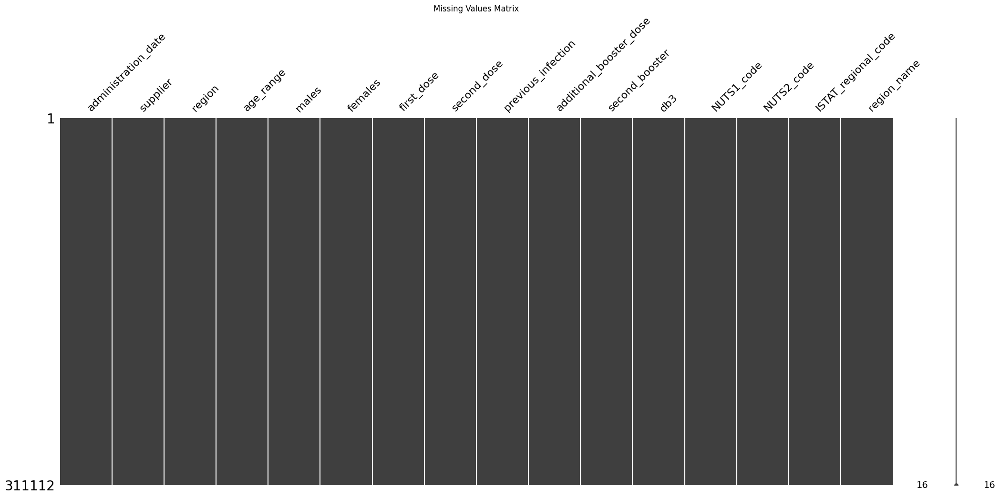

In [ ]:
import missingno as msno
import matplotlib.pyplot as plt

# Check for missing values
print("\nMissing values in the dataset:")
print(df.isnull().sum())

# Visualize missing values with a matrix plot
msno.matrix(df)
plt.title("Missing Values Matrix")
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311112 entries, 0 to 311111
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   administration_date      311112 non-null  object
 1   supplier                 311112 non-null  object
 2   region                   311112 non-null  object
 3   age_range                311112 non-null  object
 4   males                    311112 non-null  int64 
 5   females                  311112 non-null  int64 
 6   first_dose               311112 non-null  int64 
 7   second_dose              311112 non-null  int64 
 8   previous_infection       311112 non-null  int64 
 9   additional_booster_dose  311112 non-null  int64 
 10  second_booster           311112 non-null  int64 
 11  db3                      311112 non-null  int64 
 12  NUTS1_code               311112 non-null  object
 13  NUTS2_code               311112 non-null  object
 14  ISTAT_regional_code 


Columns with negative values:


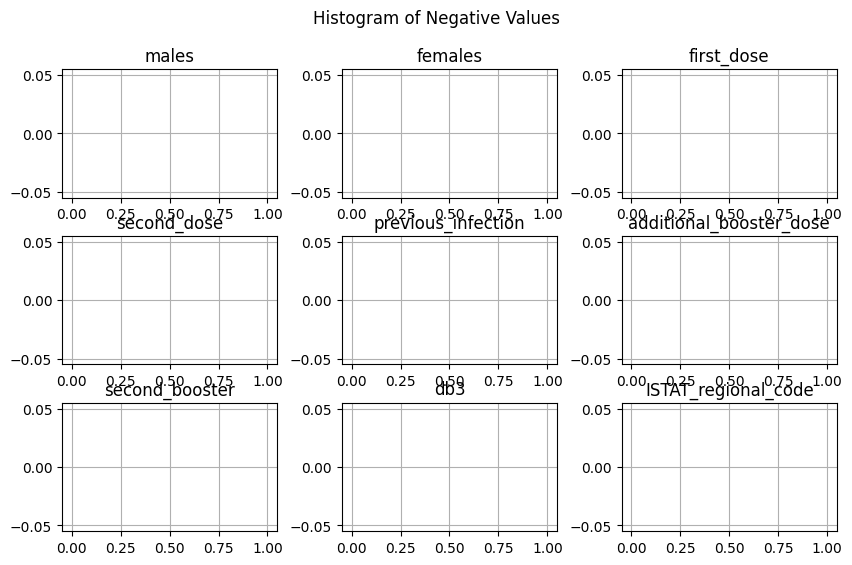

In [ ]:
# Check for negative values
print("\nColumns with negative values:")
for column in df.columns:
    # Check if the column contains numeric values
    if pd.api.types.is_numeric_dtype(df[column]):
        negative_values_count = (df[column] < 0).sum()
        if negative_values_count > 0:
            print(f"{column}: {negative_values_count} negative values")

# Visualize negative values with a histogram
numeric_df = df.select_dtypes(include=['number'])
numeric_df[numeric_df < 0].hist(bins=20, figsize=(10, 6))
plt.suptitle("Histogram of Negative Values")
plt.show()

In [ ]:
df.nunique()

administration_date        1038
supplier                      7
region                       21
age_range                    11
males                      5154
females                    5323
first_dose                 5064
second_dose                4927
previous_infection          541
additional_booster_dose    5209
second_booster             1874
db3                         492
NUTS1_code                    5
NUTS2_code                   21
ISTAT_regional_code          20
region_name                  21
dtype: int64

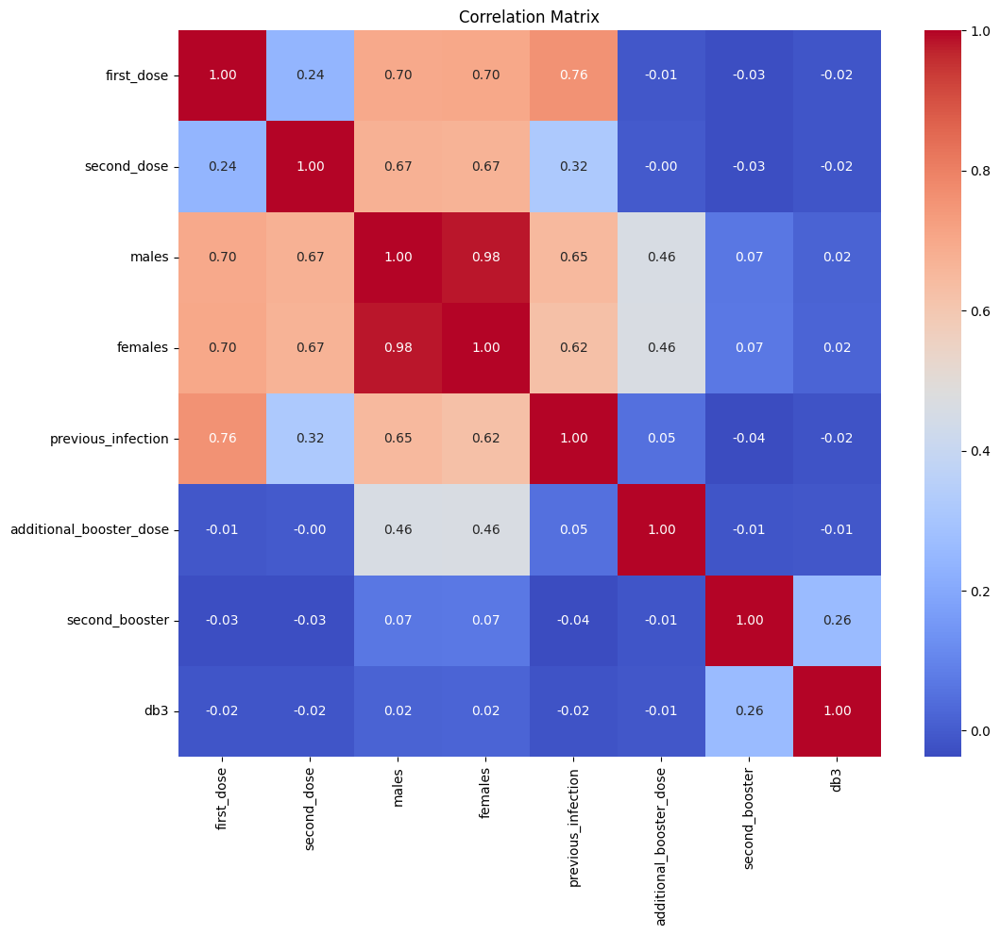

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('italian_vaccination.csv')

numerical_features = ['first_dose', 'second_dose',  'males', 'females','previous_infection', 'additional_booster_dose', 'second_booster', 'db3']


# Explore correlations between numerical features
correlation_matrix = df[numerical_features].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()





In [ ]:
!pip install plotly

In [ ]:
df.region.value_counts()

LAZ    19628
LOM    19285
PIE    17821
EMR    17460
CAM    16862
SIC    16766
VEN    16567
MAR    16049
CAL    15233
PUG    15111
TOS    15006
LIG    14754
ABR    14742
SAR    13940
FVG    13591
UMB    13067
BAS    12755
PAT    11440
PAB    11406
MOL    10513
VDA     9116
Name: region, dtype: int64

In [ ]:
df.supplier.value_counts()


Pfizer/BioNTech            148887
Moderna                    100445
Vaxzevria (AstraZeneca)     27869
Janssen                     19381
Novavax                      7994
Pfizer for children          6424
Sanofi                        112
Name: supplier, dtype: int64

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
df.females.sum(),df.males.sum()


(74557683, 70582973)

In [ ]:
total_vaccinations=df.males.sum()+df.females.sum()
total_vaccinations

145140656

In [ ]:
print("Number of Vaccination for Gender")
tot=np.array([df.males.sum(),df.females.sum()])
tot=pd.DataFrame(tot,index=["Males","Females"])
tot.columns=["Total"]
tot.gender=["Males","Females"]
tot

Number of Vaccination for Gender


<ipython-input-69-2ccd0a9784aa>:5: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



,Total
Males,70582973
Females,74557683


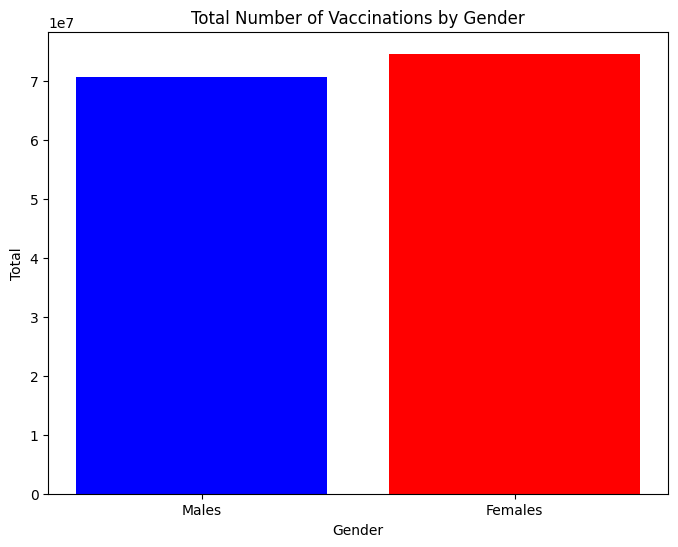

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'df' contains the dataset with columns 'males' and 'females'
# If not, replace these columns with the correct ones from your DataFrame

# Calculate the total vaccinations for each gender
total_male = df['males'].sum()
total_female = df['females'].sum()

# Plotting using Matplotlib
plt.figure(figsize=(8, 6))
plt.bar(['Males', 'Females'], [total_male, total_female], color=['blue', 'red'])
plt.title('Total Number of Vaccinations by Gender')
plt.xlabel('Gender')
plt.ylabel('Total')
plt.show()




Of course we have to weight this data with the real values for the distribution of the population in Italy. We found in this site this values of 28,749,359 for Male population and 30,101,358 for Female population who is registered at the moment in Italy.

You can find this data at this site: 28864088 https://www.statista.com/statistics/786485/population-by-gender-in-italy/


In [ ]:
tot["Registered"]=[28749359,30101358]
tot["Prop"]=tot.Total/tot.Registered
tot

,Total,Registered,Prop
Males,70582973,28749359,2.455115
Females,74557683,30101358,2.476888


In [ ]:
import pandas as pd

# Assuming df is your original DataFrame
# Replace this with your actual DataFrame
# df = ...

# Group by "administration_date" and "region_name," and sum the "males" and "females" columns
RegionOverTimeMaleFemale = pd.DataFrame(df.groupby(["administration_date", "region_name"])[["males", "females"]].sum().sort_values(by="males", ascending=False))
RegionOverTimeMaleFemale.to_csv('RegionOverTimeMaleFemale.csv', index=True)
# Print the result DataFrame
print("Number of Vaccination for Region on male and female population:")
print(RegionOverTimeMaleFemale)


Number of Vaccination for Region on male and female population:
                                 males  females
administration_date region_name                
2022-01-10          Lombardia    59421    56571
2021-07-09          Lombardia    59034    56795
2021-07-26          Lombardia    58931    50715
2022-01-11          Lombardia    58611    57165
2021-07-08          Lombardia    58485    56289
...                                ...      ...
2023-06-21          Sicilia          0        5
2023-09-18          Toscana          0        3
2023-06-23          Abruzzo          0        2
2023-09-18          Liguria          0        1
2023-06-15          Sardegna         0        1

[18536 rows x 2 columns]


In [ ]:
print("Number of Vaccination for Region on male population")
RegionAllTimeMaleFemale = pd.DataFrame(df.groupby("region_name")[["males", "females"]].sum().sort_values(by="males", ascending=False))
RegionAllTimeMaleFemale.to_csv('RegionAllTimeMaleFemale.csv', index=True)
RegionAllTimeMaleFemale

Number of Vaccination for Region on male population


,males,females
region_name,,
Lombardia,12557013,13167283
Lazio,6795228,7359582
Campania,6294885,6592766
Veneto,5746028,5943736
Emilia-Romagna,5511249,5800734
Piemonte,5323185,5632549
Sicilia,5209708,5524376
Puglia,4723588,5063953
Toscana,4604484,4917228


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# RegionAllTimeMaleFemale = ...

# Convert the Matplotlib plot to Plotly
fig = make_subplots(rows=1, cols=1)

# Add traces for males and females
fig.add_trace(go.Bar(x=RegionAllTimeMaleFemale['males'], y=RegionAllTimeMaleFemale.index, orientation='h', name='Males'))
fig.add_trace(go.Bar(x=RegionAllTimeMaleFemale['females'], y=RegionAllTimeMaleFemale.index, orientation='h', name='Females'))

# Update layout for better presentation
fig.update_layout(title_text='Number of Vaccinations by Region and Gender',
                  xaxis_title='Count',
                  yaxis_title='Region Name',
                  barmode='stack')

# Show the plot
fig.show()


In [ ]:
DosesOverTime_df = df.groupby("administration_date")['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'].sum()

# Save the result as a new CSV file
DosesOverTime_df.to_csv('DosesOverTime_df.csv', index=True)

<ipython-input-75-5506f0a0eaf8>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [ ]:
DosesOverTime_df

,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3
administration_date,,,,,,
2020-12-27,7159,0,32,0,0,0
2020-12-28,1503,0,2,0,0,0
2020-12-29,1098,0,1,0,0,0
2020-12-30,4861,0,33,0,0,0
2020-12-31,25807,0,171,0,0,0
...,...,...,...,...,...,...
2023-11-12,0,0,0,0,2,2
2023-11-13,0,0,0,1,28,103
2023-11-14,3,1,0,4,32,153


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming you have a DataFrame 'DosesOverTime_df'
# DosesOverTime_df = ...

# Define a custom color palette with bold colors
custom_palette = ["#3498db", "#2ecc71", "#e74c3c", "#f39c12", "#9b59b6", "#34495e"]

# Convert the Matplotlib/Seaborn plot to Plotly
fig = make_subplots(rows=1, cols=1)

# Iterate over the columns and add traces
for column in DosesOverTime_df.columns:
    fig.add_trace(go.Scatter(x=DosesOverTime_df.index, y=DosesOverTime_df[column], mode='lines', name=column, line=dict(width=2.5)))

# Update layout for better presentation
fig.update_layout(title_text='Number of Doses Administered Over Time',
                  xaxis_title='Administration Date',
                  yaxis_title='Cumulative Count',
                  legend_title='Dose Type')

# Show the plot
fig.show()


In [ ]:
df.groupby("administration_date")['males', 'females'].sum()

<ipython-input-78-bd726fdec4ab>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,males,females
administration_date,,
2020-12-27,3418,3773
2020-12-28,689,816
2020-12-29,487,612
2020-12-30,1967,2927
2020-12-31,10077,15901
...,...,...
2023-11-12,1,3
2023-11-13,69,63
2023-11-14,88,105


In [ ]:
df

,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name
0,2020-12-27,Moderna,LAZ,40-49,0,1,1,0,0,0,0,0,ITI,ITI4,12,Lazio
1,2020-12-27,Moderna,SIC,90+,0,1,1,0,0,0,0,0,ITG,ITG1,19,Sicilia
2,2020-12-27,Pfizer/BioNTech,ABR,20-29,1,1,2,0,0,0,0,0,ITF,ITF1,13,Abruzzo
3,2020-12-27,Pfizer/BioNTech,ABR,30-39,1,4,5,0,0,0,0,0,ITF,ITF1,13,Abruzzo
4,2020-12-27,Pfizer/BioNTech,ABR,40-49,1,8,9,0,0,0,0,0,ITF,ITF1,13,Abruzzo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311107,2023-11-16,Pfizer/BioNTech,TOS,50-59,0,1,0,0,0,0,0,1,ITI,ITI1,9,Toscana
311108,2023-11-16,Pfizer/BioNTech,TOS,60-69,3,2,0,0,0,0,0,5,ITI,ITI1,9,Toscana
311109,2023-11-16,Pfizer/BioNTech,TOS,70-79,3,3,0,0,0,0,4,2,ITI,ITI1,9,Toscana
311110,2023-11-16,Pfizer/BioNTech,TOS,80-89,5,5,0,0,0,0,0,10,ITI,ITI1,9,Toscana


In [ ]:
df["dailytotal"]=df.males+df.females
df.head()

,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name,dailytotal
0,2020-12-27,Moderna,LAZ,40-49,0,1,1,0,0,0,0,0,ITI,ITI4,12,Lazio,1
1,2020-12-27,Moderna,SIC,90+,0,1,1,0,0,0,0,0,ITG,ITG1,19,Sicilia,1
2,2020-12-27,Pfizer/BioNTech,ABR,20-29,1,1,2,0,0,0,0,0,ITF,ITF1,13,Abruzzo,2
3,2020-12-27,Pfizer/BioNTech,ABR,30-39,1,4,5,0,0,0,0,0,ITF,ITF1,13,Abruzzo,5
4,2020-12-27,Pfizer/BioNTech,ABR,40-49,1,8,9,0,0,0,0,0,ITF,ITF1,13,Abruzzo,9


In [ ]:
dictionary={"males":df.groupby("administration_date")["males"].sum(),"females":df.groupby("administration_date")["females"].sum()}
daily_gender=pd.DataFrame(dictionary)
daily_gender["Total"]=daily_gender.males+daily_gender.females

daily_gender.to_csv('daily_genderTotal.csv', index=True)
daily_gender

,males,females,Total
administration_date,,,
2020-12-27,3418,3773,7191
2020-12-28,689,816,1505
2020-12-29,487,612,1099
2020-12-30,1967,2927,4894
2020-12-31,10077,15901,25978
...,...,...,...
2023-11-12,1,3,4
2023-11-13,69,63,132
2023-11-14,88,105,193


In [ ]:
daily_gender.to_csv("dailyTotalMaleFemale.csv")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming you have a DataFrame 'daily_gender'
# daily_gender = ...

# Define a custom color palette with bold colors
custom_palette = ["#3498db", "#2ecc71", "#e74c3c", "#f39c12"]

# Convert the Matplotlib/Seaborn plot to Plotly
fig = make_subplots(rows=1, cols=1)

# Iterate over the columns and add traces
for column in daily_gender.columns:
    fig.add_trace(go.Scatter(x=daily_gender.index, y=daily_gender[column], mode='lines', name=column, line=dict(width=2.5)))

# Update layout for better presentation
fig.update_layout(title_text='Number of Vaccinations by Gender Over Time',
                  xaxis_title='Administration Date',
                  yaxis_title='Cumulative Count',
                  legend_title='Gender')

# Show the plot
fig.show()


In [ ]:
df.age_range


0         40-49
1           90+
2         20-29
3         30-39
4         40-49
          ...  
311107    50-59
311108    60-69
311109    70-79
311110    80-89
311111      90+
Name: age_range, Length: 311112, dtype: object

In [ ]:

print("Number of Vaccination for Age in class for the male population")
df.groupby("age_range")["males"].sum().sort_values(ascending = False)

Number of Vaccination for Age in class for the male population


age_range
50-59    12282643
60-69    10501557
40-49    10452283
70-79     8800519
30-39     8271865
20-29     7818852
80-89     5192786
12-19     5081374
05-11     1341466
90+        839296
00-04         332
Name: males, dtype: int64

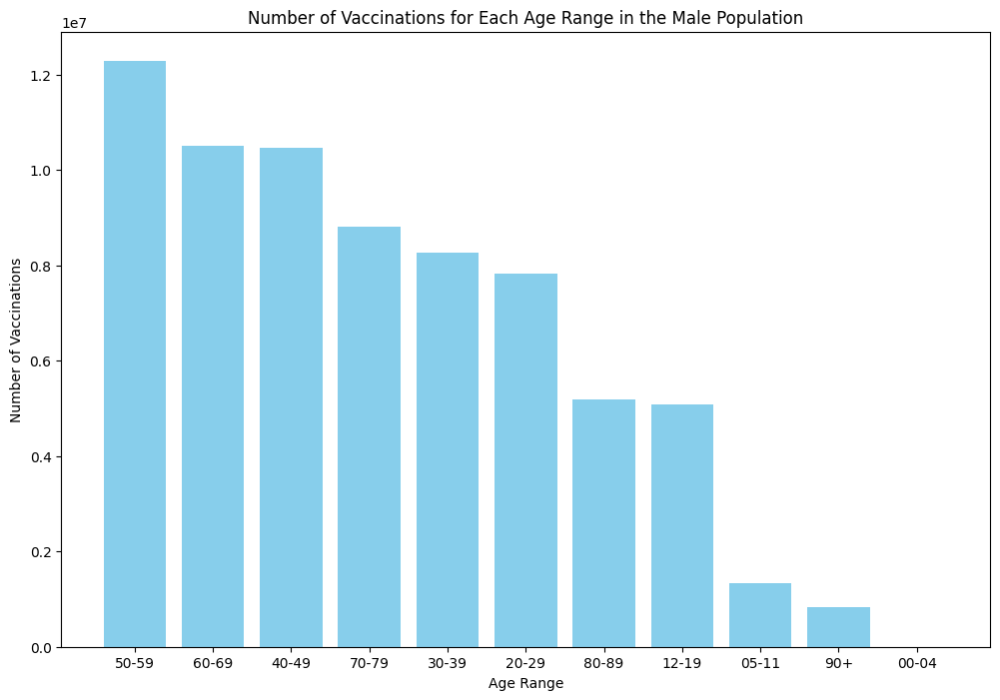

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'MaleVaccinationByAge'
# MaleVaccinationByAge = ...
MaleVaccinationByAge = df.groupby("age_range")["males"].sum().sort_values(ascending=False).reset_index()

# Plotting without interactive features
plt.figure(figsize=(12, 8))
plt.bar(MaleVaccinationByAge['age_range'], MaleVaccinationByAge['males'], color='skyblue')
plt.title('Number of Vaccinations for Each Age Range in the Male Population')
plt.xlabel('Age Range')
plt.ylabel('Number of Vaccinations')
plt.show()


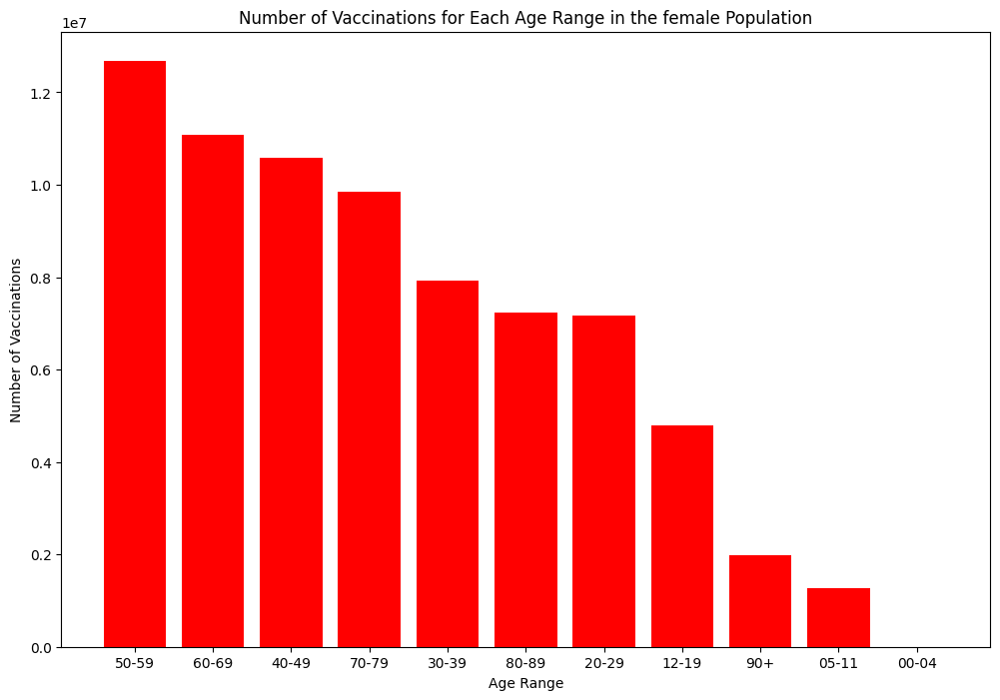

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'feMaleVaccinationByAge'
# feMaleVaccinationByAge = ...
femaleVaccinationByAge = df.groupby("age_range")["females"].sum().sort_values(ascending=False).reset_index()

# Plotting without interactive features
plt.figure(figsize=(12, 8))
plt.bar(femaleVaccinationByAge['age_range'], femaleVaccinationByAge['females'], color='red')
plt.title('Number of Vaccinations for Each Age Range in the female Population')
plt.xlabel('Age Range')
plt.ylabel('Number of Vaccinations')
plt.show()


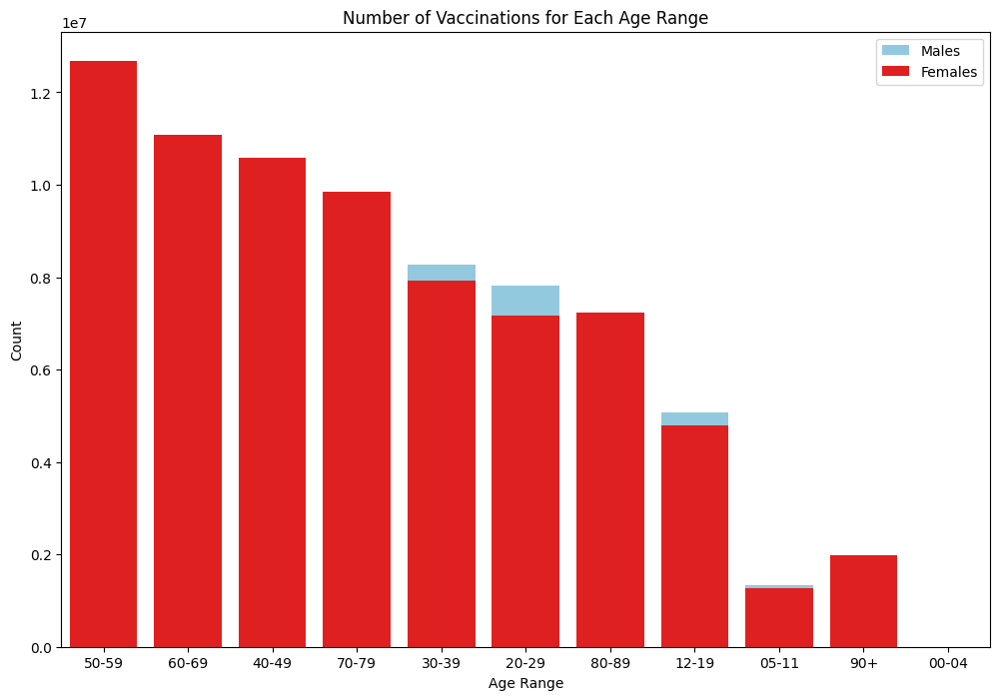

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame 'df'
# df = ...

# Group by "age_range" and sum the doses for males, females, and total
VaccinationByAge = df.groupby("age_range")[["males", "females"]].sum().sort_values(by="males", ascending=False)

# Set Seaborn's "deep" color palette for distinct colors
sns.set_palette("deep")

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(x=VaccinationByAge.index, y=VaccinationByAge["males"], color="skyblue", label="Males")
sns.barplot(x=VaccinationByAge.index, y=VaccinationByAge["females"], color="red", label="Females")
plt.title('Number of Vaccinations for Each Age Range')
plt.xlabel('Age Range')
plt.ylabel('Count')
plt.legend()
plt.show()


In [ ]:
print(((df.groupby("age_range")["dailytotal"].sum().sort_values()/total_vaccinations)*100).round(2))

age_range
00-04     0.00
05-11     1.80
90+       1.95
12-19     6.80
80-89     8.56
20-29    10.33
30-39    11.16
70-79    12.84
40-49    14.49
60-69    14.87
50-59    17.20
Name: dailytotal, dtype: float64


In [ ]:
male=pd.DataFrame(df.groupby("supplier")["males"].sum().sort_values(ascending = False)/df.males.sum())
female=pd.DataFrame(df.groupby("supplier")["females"].sum().sort_values(ascending = False)/df.females.sum())

In [ ]:
supplier_tot=pd.DataFrame(df.groupby("supplier").sum())
supplier_tot.to_csv('supplier_total.csv', index=True)

supplier_tot

<ipython-input-91-7e279da7b3a4>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,ISTAT_regional_code,dailytotal
supplier,,,,,,,,,,
Janssen,864439,644086,1508525,0,0,0,0,0,194694,1508525
Moderna,17248050,17155494,6674646,6716315,406324,20080036,491107,35116,1046355,34403544
Novavax,20994,22335,21686,18680,2963,0,0,0,74037,43329
Pfizer for children,1341880,1275426,1317923,1199227,93980,5987,39,150,64016,2617306
Pfizer/BioNTech,45360424,49032722,32971381,32865497,1403578,20414892,6241279,496519,1517835,94393146
Sanofi,115,125,0,0,0,14,194,32,1481,240
Vaxzevria (AstraZeneca),5747071,6427495,6365677,5638853,170036,0,0,0,293929,12174566


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Add 'males' and 'females' for each record and create a new column 'total'
supplier_tot['total'] = supplier_tot['males'] + supplier_tot['females']
supplier_tot.to_csv('supplier_total.csv', index=True)

# Display the updated DataFrame
supplier_tot


,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,ISTAT_regional_code,dailytotal,total
supplier,,,,,,,,,,,
Janssen,864439,644086,1508525,0,0,0,0,0,194694,1508525,1508525
Moderna,17248050,17155494,6674646,6716315,406324,20080036,491107,35116,1046355,34403544,34403544
Novavax,20994,22335,21686,18680,2963,0,0,0,74037,43329,43329
Pfizer for children,1341880,1275426,1317923,1199227,93980,5987,39,150,64016,2617306,2617306
Pfizer/BioNTech,45360424,49032722,32971381,32865497,1403578,20414892,6241279,496519,1517835,94393146,94393146
Sanofi,115,125,0,0,0,14,194,32,1481,240,240
Vaxzevria (AstraZeneca),5747071,6427495,6365677,5638853,170036,0,0,0,293929,12174566,12174566


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'supplier_tot'
# supplier_tot = ...

# Group by "supplier" and sum the doses for males, females, and total
SupplierVaccination = supplier_tot.groupby("supplier")[["males", "females"]].sum().reset_index()

# Create an interactive stacked bar plot using Plotly Express
fig = px.bar(SupplierVaccination, x='supplier', y=['males', 'females'],
             labels={'value': 'Count', 'variable': 'Gender'},
             color_discrete_sequence=['#3498db', '#e74c3c'],
             title='Vaccination Count by Supplier')

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming you have a DataFrame 'supplier_tot'
# supplier_tot = ...

# Group by "supplier" and sum the doses for males, females, and total
SupplierVaccination = supplier_tot.groupby("supplier")[["males", "females"]].sum()

# Set a custom color palette for distinct colors
custom_palette = sns.color_palette("husl", 3)
sns.set_palette(custom_palette)

# Convert the Matplotlib/Seaborn plot to Plotly
fig = make_subplots(rows=1, cols=1)

# Iterate over the columns and add traces
for gender in SupplierVaccination.columns:
    fig.add_trace(go.Bar(x=SupplierVaccination.index, y=SupplierVaccination[gender], name=gender))

# Update layout for better presentation
fig.update_layout(title_text='Vaccination Count by Supplier (log scale)',
                  xaxis_title='Supplier',
                  yaxis_title='Count (log scale)',
                  barmode='stack')

# Set y-axis to log scale
fig.update_layout(yaxis_type='log')

# Show the plot
fig.show()


In [ ]:
massi=male
massi["gender"]="male"
massi.columns=["tot","gender"]
massi

,tot,gender
supplier,,
Pfizer/BioNTech,0.642654,male
Moderna,0.244366,male
Vaxzevria (AstraZeneca),0.081423,male
Pfizer for children,0.019011,male
Janssen,0.012247,male
Novavax,0.000297,male
Sanofi,0.000002,male


In [ ]:
female["gender"]="female"
female.columns=["tot","gender"]
female

,tot,gender
supplier,,
Pfizer/BioNTech,0.657648,female
Moderna,0.230097,female
Vaxzevria (AstraZeneca),0.086208,female
Pfizer for children,0.017107,female
Janssen,0.008639,female
Novavax,0.000300,female
Sanofi,0.000002,female


In [ ]:
#male.index.sort_values()
supp_man=pd.Series(df.groupby("supplier")["males"].sum())
supp_women=pd.Series(df.groupby("supplier")["females"].sum())
supp_women
supplier_gender={"man":supp_man,"woman":supp_women}
pd.DataFrame(supplier_gender,index=male.index.sort_values())

,man,woman
supplier,,
Janssen,864439,644086
Moderna,17248050,17155494
Novavax,20994,22335
Pfizer for children,1341880,1275426
Pfizer/BioNTech,45360424,49032722
Sanofi,115,125
Vaxzevria (AstraZeneca),5747071,6427495


In [ ]:
massi.tot=df.groupby("supplier")["males"].sum().sort_values(ascending = False)
female.tot=df.groupby("supplier")["females"].sum().sort_values(ascending = False)
genderdf=[male,female]
genderdf=pd.concat(genderdf)
genderdf["supplier"]=genderdf.index
genderdf

,tot,gender,supplier
supplier,,,
Pfizer/BioNTech,45360424,male,Pfizer/BioNTech
Moderna,17248050,male,Moderna
Vaxzevria (AstraZeneca),5747071,male,Vaxzevria (AstraZeneca)
Pfizer for children,1341880,male,Pfizer for children
Janssen,864439,male,Janssen
Novavax,20994,male,Novavax
Sanofi,115,male,Sanofi
Pfizer/BioNTech,49032722,female,Pfizer/BioNTech
Moderna,17155494,female,Moderna


In [ ]:
df["dailytotal"]=df.males+df.females

reg_name=pd.DataFrame(df.groupby("region_name")[['dailytotal','first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3',"males","females"]].sum())
reg_name.to_csv("RegionsDosesTotal.csv")

#reg_name["pop_resid"]=regions["pop_resid"]
#reg_name["propTV"]=reg_name["TotVaccine"]/reg_name["pop_resid"]
reg_name1=reg_name.drop(index=("Provincia Autonoma Bolzano / Bozen"))
reg_name1=reg_name1.drop(index=("Provincia Autonoma Trento"))
reg_name


,dailytotal,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,males,females
region_name,,,,,,,,,
Abruzzo,3095794,1050316,1015394,38313,877414,110071,4286,1507517,1588277
Basilicata,1312104,454773,432759,14346,371645,36804,1777,641829,670275
Calabria,4216683,1512593,1434190,36571,1140680,89816,2833,2058807,2157876
Campania,12887651,4539483,4326891,197781,3526110,286912,10474,6294885,6592766
Emilia-Romagna,11311983,3664281,3516124,172667,3128834,748877,81200,5511249,5800734
Friuli-Venezia Giulia,2883117,956358,908683,50540,817352,141720,8464,1408866,1474251
Lazio,14154810,4851451,4481045,173288,4027744,584847,36435,6795228,7359582
Liguria,3767090,1275123,1220159,30528,1025223,203224,12833,1815181,1951909
Lombardia,25724296,8429651,7975183,335395,7356309,1514331,113427,12557013,13167283


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming you have a DataFrame 'df'
# df = ...

# Add a column for daily total
df["dailytotal"] = df["males"] + df["females"]

# Group by "supplier" and sum the doses for each category
SupplierDoses = df.groupby("supplier")[['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3']].sum()

# Set Seaborn's "deep" color palette for distinct colors
sns.set_palette("deep")

# Convert the Matplotlib/Seaborn plot to Plotly
fig = make_subplots(rows=1, cols=1)

# Iterate over the columns and add traces
for dose_type in SupplierDoses.columns:
    fig.add_trace(go.Bar(x=SupplierDoses.index, y=SupplierDoses[dose_type], name=dose_type))

# Update layout for better presentation
fig.update_layout(title_text='Number of Doses by Supplier',
                  xaxis_title='Supplier',
                  yaxis_title='Count',
                  barmode='stack')

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df'
# df = ...

# Add a column for daily total
df["dailytotal"] = df["males"] + df["females"]

# Group by "supplier" and sum the doses for each category
SupplierDoses = df.groupby("supplier")[['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3']].sum()

# Reset index to convert the grouped data back to a DataFrame
SupplierDoses.reset_index(inplace=True)

# Melt the DataFrame for Plotly Express compatibility
SupplierDoses_melted = pd.melt(SupplierDoses, id_vars=['supplier'], var_name='Dose Type', value_name='Count')

# Create an interactive bar plot using Plotly Express
fig = px.bar(SupplierDoses_melted, x='supplier', y='Count', color='Dose Type',
             labels={'Count': 'Number of Doses (log scale)'},
             title='Number of Doses by Supplier (log scale)',
             log_y=True)  # Set log scale on the y-axis

# Show the plot
fig.show()


In [ ]:
df.head()

,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name,dailytotal
0,2020-12-27,Moderna,LAZ,40-49,0,1,1,0,0,0,0,0,ITI,ITI4,12,Lazio,1
1,2020-12-27,Moderna,SIC,90+,0,1,1,0,0,0,0,0,ITG,ITG1,19,Sicilia,1
2,2020-12-27,Pfizer/BioNTech,ABR,20-29,1,1,2,0,0,0,0,0,ITF,ITF1,13,Abruzzo,2
3,2020-12-27,Pfizer/BioNTech,ABR,30-39,1,4,5,0,0,0,0,0,ITF,ITF1,13,Abruzzo,5
4,2020-12-27,Pfizer/BioNTech,ABR,40-49,1,8,9,0,0,0,0,0,ITF,ITF1,13,Abruzzo,9


In [ ]:

#Not WORKING!!!!!!!!!!!!!!!!!!!!!!!

In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'
# df = ...

# Sum the doses for each region
df_summed = df.groupby('region_name').agg({
    'first_dose': 'sum',
    'second_dose': 'sum',
    'previous_infection': 'sum',
    'additional_booster_dose': 'sum',
    'second_booster': 'sum',
    'db3': 'sum'
}).reset_index()

# Melt the DataFrame to create a long-format for Plotly Express
df_melted = pd.melt(df_summed, id_vars=['region_name'], value_vars=['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'],
                    var_name='Dose Type', value_name='Count')

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(df_melted, x='Count', y='region_name', color='Dose Type',
             labels={'Count': 'Count', 'Dose Type': 'Dose Type'},
             title='Distribution of Vaccination Doses by Region',
             orientation='h', barmode='stack')  # Set orientation='h' for horizontal and barmode='stack' for stacked bars

# Show the plot
fig.show()


<ipython-input-9-aa2b62571360>:23: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




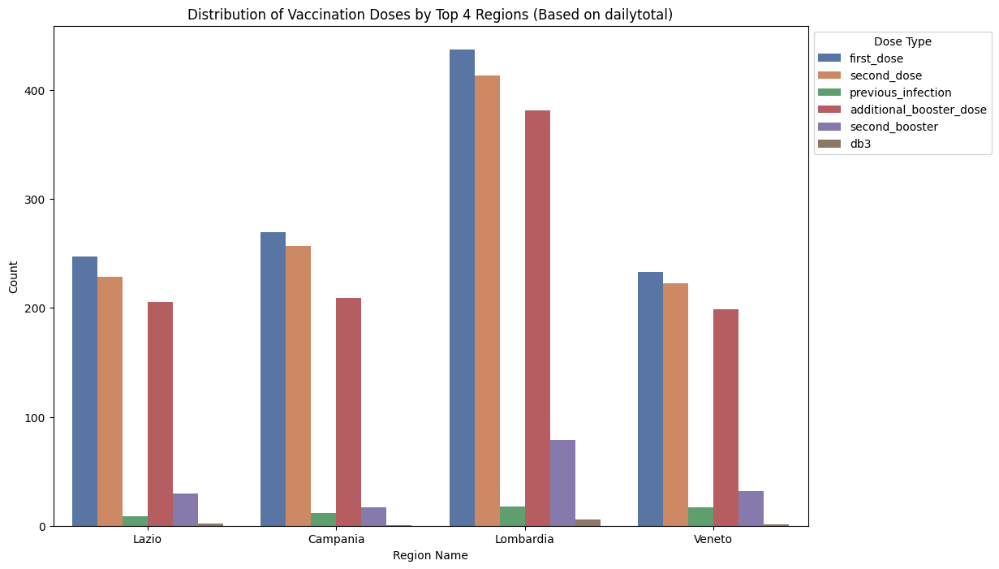

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame 'df' with columns 'region_name', 'first_dose', 'second_dose', 'dailytotal', etc.
# df = ...

# Get the top 4 regions based on 'dailytotal'
top_regions = df.groupby('region_name')['dailytotal'].sum().sort_values(ascending=False).head(4).index

# Filter DataFrame for the top 4 regions
df_top_regions = df[df['region_name'].isin(top_regions)]

# Melt the DataFrame for Seaborn compatibility
df_melted = pd.melt(df_top_regions, id_vars=['region_name'], value_vars=['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'],
                    var_name='Dose Type', value_name='Count')

# Set Seaborn's "deep" color palette for distinct colors
sns.set_palette("deep")

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(x='region_name', y='Count', hue='Dose Type', data=df_melted, ci=None)  # Remove confidence intervals
plt.title('Distribution of Vaccination Doses by Top 4 Regions (Based on dailytotal)')
plt.xlabel('Region Name')
plt.ylabel('Count')
plt.legend(title='Dose Type', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()


In [ ]:

# Not Working!!!!!!!!!!!!!!!!

In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name' and 'supplier'
# df = ...

# Count the occurrences of each supplier in each region
supplier_region_counts = df.groupby(['region_name', 'supplier']).size().reset_index(name='Count')

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(supplier_region_counts, x='Count', y='region_name', color='supplier',
             labels={'Count': 'Occurrences'},
             title='Distribution of Suppliers by Region',
             orientation='h')  # Set orientation='h' for horizontal

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'supplier', and 'dailytotal'
# df = ...

# Sum the 'dailytotal' for each supplier in each region
supplier_region_weighted_counts = df.groupby(['region_name', 'supplier'])['dailytotal'].sum().reset_index(name='Weighted_Count')

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(supplier_region_weighted_counts, x='Weighted_Count', y='region_name', color='supplier',
             labels={'Weighted_Count': 'Weighted Occurrences'},
             title='Distribution of Suppliers by Region (Weighted by dailytotal)',
             orientation='h')  # Set orientation='h' for horizontal

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns like 'administration_date', 'supplier', 'dailytotal', etc.
# df = ...

# Create an interactive line plot using Plotly Express
fig = px.line(df, x='administration_date', y='dailytotal', color='supplier',
              labels={'dailytotal': 'Daily Vaccination Count'},
              title='Vaccination Counts Over Time by Supplier')

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns like 'first_dose', 'second_dose', etc.
# df = ...

# Sum the doses for each type
dose_sums = df[['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3']].sum()

# Create a DataFrame for plotting
df_plot = pd.DataFrame({'Dose Type': dose_sums.index, 'Count': dose_sums.values})

# Create an interactive bar plot using Plotly Express
fig = px.bar(df_plot, x='Dose Type', y='Count',
             labels={'Count': 'Total Number of Doses'},
             title='Total Number of Doses by Dose Type')

# Show the plot
fig.show()


In [ ]:
import numpy as np
import pandas as pd

# Load the dataset into a Pandas DataFrame
file_path = 'ita_reg_ann_data.csv'
df = pd.read_csv(file_path)

# Print the columns
print("Columns in the dataset:")
print(df.columns)


Columns in the dataset:
Index(['cod_reg', 'den_reg', 'gdp_tot', 'gdp_procap', 'pop_resid',
       'superf_kmq', 'dens_ab', 'num_com', 'num_prov', 'num_teams'],
      dtype='object')


In [ ]:
df.head()

,cod_reg,den_reg,gdp_tot,gdp_procap,pop_resid,superf_kmq,dens_ab,num_com,num_prov,num_teams
0,1,Piemonte,129322,30300,4356406,25387.07,172,1181,8,2
1,2,Valle d'Aosta,4436,35200,125666,3260.90,39,74,1,0
2,3,Lombardia,366541,38200,10060574,23863.65,422,1506,12,4
3,4,Trentino Alto Adige,41104,39074,1072276,13605.50,79,282,2,0
4,5,Veneto,155515,33100,4905854,18345.35,267,563,7,1


In [ ]:
import pandas as pd

# Load the datasets
italian_vaccination = pd.read_csv('italian_vaccination.csv')
ita_reg_ann_data = pd.read_csv('ita_reg_ann_data.csv')

# Extract relevant columns from ita_reg_ann_data
columns_to_add = ['cod_reg', 'den_reg', 'pop_resid', 'gdp_tot', 'dens_ab']
data_to_add = ita_reg_ann_data[columns_to_add]

# Merge datasets based on 'cod_reg' and 'den_reg'
merged_data = pd.merge(italian_vaccination, data_to_add, how='left', left_on=['ISTAT_regional_code', 'region_name'],
                      right_on=['cod_reg', 'den_reg'])

# Drop duplicate columns and unnecessary ones
columns_to_drop = ['cod_reg', 'den_reg']
merged_data.drop(columns=columns_to_drop, inplace=True)

# Save the merged dataset
merged_data.to_csv('italian_vaccination_mergedPopGDP.csv', index=False)


In [ ]:
merged_data.tail()

,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name,pop_resid,gdp_tot,dens_ab
311107,2023-11-16,Pfizer/BioNTech,TOS,50-59,0,1,0,0,0,0,0,1,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0
311108,2023-11-16,Pfizer/BioNTech,TOS,60-69,3,2,0,0,0,0,0,5,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0
311109,2023-11-16,Pfizer/BioNTech,TOS,70-79,3,3,0,0,0,0,4,2,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0
311110,2023-11-16,Pfizer/BioNTech,TOS,80-89,5,5,0,0,0,0,0,10,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0
311111,2023-11-16,Pfizer/BioNTech,TOS,90+,2,1,0,0,0,0,0,3,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0


In [ ]:
import numpy as np
import pandas as pd

# Load the dataset into a Pandas DataFrame
file_path = '/content/ita_reg_mens_clima.csv'
df = pd.read_csv(file_path)

# Print the columns
print("Columns in the dataset:")
print(df.columns)


Columns in the dataset:
Index(['cod_reg', 'month', 'evap', 'prec', 'tmax', 'tmin'], dtype='object')


In [ ]:
df.head()


,administration_date,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,...,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name,pop_resid,gdp_tot,dens_ab,dailytotal,gdp_tot_million,dailytotal_million
0,2020-12-27,Moderna,LAZ,40-49,0,1,1,0,0,0,...,ITI,ITI4,12,Lazio,5879082.0,185935.0,341.0,1,185935.0,1
1,2020-12-27,Moderna,SIC,90+,0,1,1,0,0,0,...,ITG,ITG1,19,Sicilia,4999891.0,86998.0,194.0,1,86998.0,1
2,2020-12-27,Pfizer/BioNTech,ABR,20-29,1,1,2,0,0,0,...,ITF,ITF1,13,Abruzzo,1311580.0,31959.0,121.0,2,31959.0,2
3,2020-12-27,Pfizer/BioNTech,ABR,30-39,1,4,5,0,0,0,...,ITF,ITF1,13,Abruzzo,1311580.0,31959.0,121.0,5,31959.0,5
4,2020-12-27,Pfizer/BioNTech,ABR,40-49,1,8,9,0,0,0,...,ITF,ITF1,13,Abruzzo,1311580.0,31959.0,121.0,9,31959.0,9


In [ ]:
import numpy as np
import pandas as pd

# Load the dataset into a Pandas DataFrame
file_path = '/content/italian_vaccination_mergedPopGDP.csv'
df = pd.read_csv(file_path)
df['dailytotal'] = df['males'] + df['females']
df.to_csv('italian_vaccination_mergedPopGDP.csv', index=False)

# Print the columns
print("Columns in the dataset:")
print(df.columns)


Columns in the dataset:
Index(['administration_date', 'supplier', 'region', 'age_range', 'males',
       'females', 'first_dose', 'second_dose', 'previous_infection',
       'additional_booster_dose', 'second_booster', 'db3', 'NUTS1_code',
       'NUTS2_code', 'ISTAT_regional_code', 'region_name', 'pop_resid',
       'gdp_tot', 'dens_ab', 'dailytotal'],
      dtype='object')


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name' and 'pop_resid'
# df = ...

# Extract unique pop_resid values for each region_name
unique_pop_resid = df.groupby('region_name')['pop_resid'].first().reset_index()

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(unique_pop_resid, x='pop_resid', y='region_name',
             labels={'pop_resid': 'Population Residual'},
             title='Population Residual for Each Region',
             orientation='h')  # Set orientation='h' for horizontal

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name' and 'dailytotal'
# df = ...

# Group by 'region_name' and sum 'dailytotal'
region_dailytotal = df.groupby('region_name')['dailytotal'].sum().reset_index()

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(region_dailytotal, x='dailytotal', y='region_name',
             labels={'dailytotal': 'Total Daily Vaccinations'},
             title='Total Daily Vaccinations for Each Region',
             orientation='h')  # Set orientation='h' for horizontal

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'dailytotal', and 'pop_resid'
# df = ...

# Group by 'region_name' and sum 'dailytotal', and extract unique 'pop_resid' values
region_stats = df.groupby('region_name').agg({'dailytotal': 'sum', 'pop_resid': 'first'}).reset_index()

# Melt the DataFrame to create a long-format for Plotly Express
melted_df = pd.melt(region_stats, id_vars='region_name', value_vars=['dailytotal', 'pop_resid'],
                    var_name='Metric', value_name='Value')

# Create a grouped bar plot
fig = px.bar(melted_df, x='Value', y='region_name', color='Metric',
             labels={'Value': 'Value', 'Metric': 'Metric'},
             title='Comparison of Population and Vaccination Doses for Each Region',
             orientation='h', width=800, height=400)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'dailytotal', and 'pop_resid'
# df = ...

# Group by 'region_name' and sum 'dailytotal', and extract unique 'pop_resid' values
region_stats = df.groupby('region_name').agg({'dailytotal': 'sum', 'pop_resid': 'first'}).reset_index()

# Create a scatter plot
fig = px.scatter(region_stats, x='dailytotal', y='pop_resid', color='region_name',
                 labels={'dailytotal': 'Daily Total', 'pop_resid': 'Population Residual'},
                 title='Comparison of Daily Total with Population Residual for Each Region',
                 width=800, height=400)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'gdp_tot', and 'dailytotal'
# df = ...

# Group by 'region_name' and get the first value for 'gdp_tot' and sum 'dailytotal'
region_stats = df.groupby('region_name').agg({'gdp_tot': 'first', 'dailytotal': 'sum'}).reset_index()

# Replace NaN values in 'gdp_tot' with a default size (e.g., 100)
default_size = 100
region_stats['gdp_tot'].fillna(default_size, inplace=True)

# Convert 'gdp_tot' to million euros
region_stats['gdp_tot_million'] = region_stats['gdp_tot'] * 1_000_000

# Create a scatter plot
fig = px.scatter(region_stats, x='dailytotal', y='gdp_tot_million', color='region_name',
                 size='gdp_tot',  # Use 'gdp_tot' for the size of the markers
                 labels={'dailytotal': 'Daily Total', 'gdp_tot_million': 'GDP Total ', 'region_name': 'Region'},
                 title='Comparison of Daily Total with GDP Total for Each Region',
                 width=800, height=400)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'previous_infection'
# df = ...

# Sum the 'previous_infection' doses for each region
df_sum_previous_infection = df.groupby('region_name')['previous_infection'].sum().reset_index()

# Create an interactive horizontal bar plot for 'previous_infection' doses using Plotly Express
fig = px.bar(df_sum_previous_infection, x='previous_infection', y='region_name',
             labels={'previous_infection': 'Count', 'region_name': 'Region'},
             title='Distribution of Previous Infection Doses by Region',
             orientation='h')

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'previous_infection'
# df = ...

# Sum the 'previous_infection' doses for each region
df_sum_previous_infection = df.groupby('region_name')['previous_infection'].sum().reset_index()

# Create a bar plot for 'previous_infection' doses using Plotly Express
fig = px.bar(df_sum_previous_infection, x='region_name', y='previous_infection',
             labels={'previous_infection': 'Count', 'region_name': 'Region'},
             title='Distribution of Previous Infection Doses by Region')

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'previous_infection', 'gdp_tot', and 'pop_resid'
# df = ...

# Multiply 'gdp_tot' by 1,000,000 to convert to million euros
df['gdp_tot'] *= 1000000

# Group by 'region_name' and sum 'previous_infection'
region_stats = df.groupby('region_name').agg({'previous_infection': 'sum', 'gdp_tot': 'first', 'pop_resid': 'first'}).reset_index()

# Fill NaN values in 'pop_resid' with 0
region_stats['pop_resid'].fillna(0, inplace=True)

# Create a scatter plot
fig = px.scatter(region_stats, x='previous_infection', y='gdp_tot', size='pop_resid', color='region_name',
                 labels={'previous_infection': 'Sum of Previous Infection Count', 'gdp_tot': 'GDP Total', 'pop_resid': 'Population'},
                 title='Comparison of Previous Infection with GDP and Population for Each Region',
                 width=800, height=400)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'region_name', 'age_range', and 'dailytotal'
# df = ...

# Group by 'region_name' and 'age_range', summing 'dailytotal'
region_age_distribution = df.groupby(['region_name', 'age_range'])['dailytotal'].sum().reset_index()

# Create a bar plot
fig = px.bar(region_age_distribution, x='region_name', y='dailytotal', color='age_range',
             labels={'dailytotal': 'Count', 'region_name': 'Region', 'age_range': 'Age Range'},
             title='Distribution of Age Range by Region',
             width=1000, height=700)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'age_range', 'first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'
# df = ...

# Sum the doses for each age range
df_summed = df.groupby('age_range').agg({
    'first_dose': 'sum',
    'second_dose': 'sum',
    'previous_infection': 'sum',
    'additional_booster_dose': 'sum',
    'second_booster': 'sum',
    'db3': 'sum'
}).reset_index()

# Melt the DataFrame to create a long-format for Plotly Express
df_melted = pd.melt(df_summed, id_vars=['age_range'], value_vars=['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'],
                    var_name='Dose Type', value_name='Count')

# Create a bar plot
fig = px.bar(df_melted, x='Dose Type', y='Count', color='age_range',
             labels={'Count': 'Count', 'age_range': 'Age Range', 'Dose Type': 'Dose Type'},
             title='Distribution of Doses by Age Range',
             width=1000, height=600)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'age_range', 'supplier', and 'dailytotal'
# df = ...

# Group by 'age_range', 'supplier', and sum 'dailytotal'
df_summed = df.groupby(['age_range', 'supplier']).agg({'dailytotal': 'sum'}).reset_index()

# Create a bar plot
fig = px.bar(df_summed, x='supplier', y='dailytotal', color='age_range',
             labels={'dailytotal': 'Total Count', 'age_range': 'Age Range', 'supplier': 'Supplier'},
             title='Distribution of Counts by Age Range and Supplier',
             width=1000, height=600)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame 'df' with columns 'age_range', 'first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3', 'supplier'
# df = ...

# Sum the doses for each age range and supplier
df_summed = df.groupby(['age_range', 'supplier']).agg({
    'first_dose': 'sum',
    'second_dose': 'sum',
    'previous_infection': 'sum',
    'additional_booster_dose': 'sum',
    'second_booster': 'sum',
    'db3': 'sum'
}).reset_index()

# Melt the DataFrame to create a long-format for Plotly Express
df_melted = pd.melt(df_summed, id_vars=['age_range', 'supplier'], value_vars=['first_dose', 'second_dose', 'previous_infection', 'additional_booster_dose', 'second_booster', 'db3'],
                    var_name='Dose Type', value_name='Count')

# Create a bar plot
fig = px.bar(df_melted, x='Dose Type', y='Count', color='age_range', facet_col='supplier',
             labels={'Count': 'Count', 'age_range': 'Age Range', 'Dose Type': 'Dose Type'},
             title='Distribution of Doses by Age Range and Supplier',
             width=1200, height=800)

# Show the plot
fig.show()


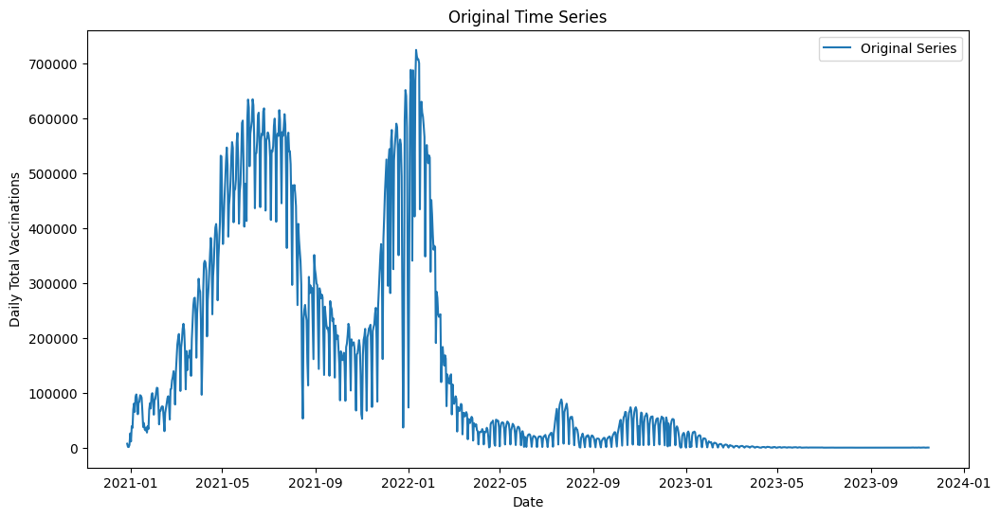

ADF Statistic (original series): -1.992074704689255
p-value (original series): 0.2900588401910754
Critical Values (original series): {'1%': -3.436802656106708, '5%': -2.8643889233382502, '10%': -2.5682868944525388}


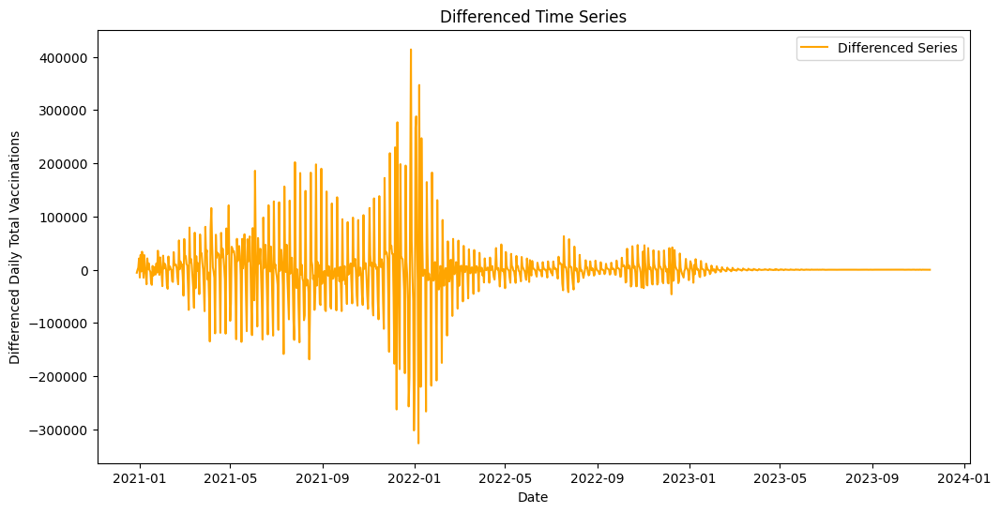


ADF Statistic after differencing: -5.904872442713727
p-value after differencing: 2.723523353104693e-07
Critical Values after differencing: {'1%': -3.436802656106708, '5%': -2.8643889233382502, '10%': -2.5682868944525388}

The original series is likely non-stationary.
The differenced series is likely stationary.


In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')

# Convert 'administration_date' to datetime
df['administration_date'] = pd.to_datetime(df['administration_date'])

# Group by dates and sum the 'dailytotal'
dailytotal_series = df.groupby('administration_date')['dailytotal'].sum()

# Plot the original time series
plt.figure(figsize=(12, 6))
plt.plot(dailytotal_series, label='Original Series')
plt.title('Original Time Series')
plt.xlabel('Date')
plt.ylabel('Daily Total Vaccinations')
plt.legend()
plt.show()

# Perform Augmented Dickey-Fuller (ADF) test for stationary testing on the original series
result = adfuller(dailytotal_series, autolag='AIC')
print('ADF Statistic (original series):', result[0])
print('p-value (original series):', result[1])
print('Critical Values (original series):', result[4])

# If needed, apply differencing to achieve stationarity (e.g., first-order differencing)
dailytotal_diff = dailytotal_series.diff().dropna()

# Plot the differenced series
plt.figure(figsize=(12, 6))
plt.plot(dailytotal_diff, label='Differenced Series', color='orange')
plt.title('Differenced Time Series')
plt.xlabel('Date')
plt.ylabel('Differenced Daily Total Vaccinations')
plt.legend()
plt.show()

# Perform ADF test on the differenced series
result_diff = adfuller(dailytotal_diff, autolag='AIC')
print('\nADF Statistic after differencing:', result_diff[0])
print('p-value after differencing:', result_diff[1])
print('Critical Values after differencing:', result_diff[4])

# Print whether the series is stationary based on p-value
if result[1] <= 0.05:
    print('\nThe original series is likely stationary.')
else:
    print('\nThe original series is likely non-stationary.')

if result_diff[1] <= 0.05:
    print('The differenced series is likely stationary.')
else:
    print('The differenced series is likely non-stationary.')


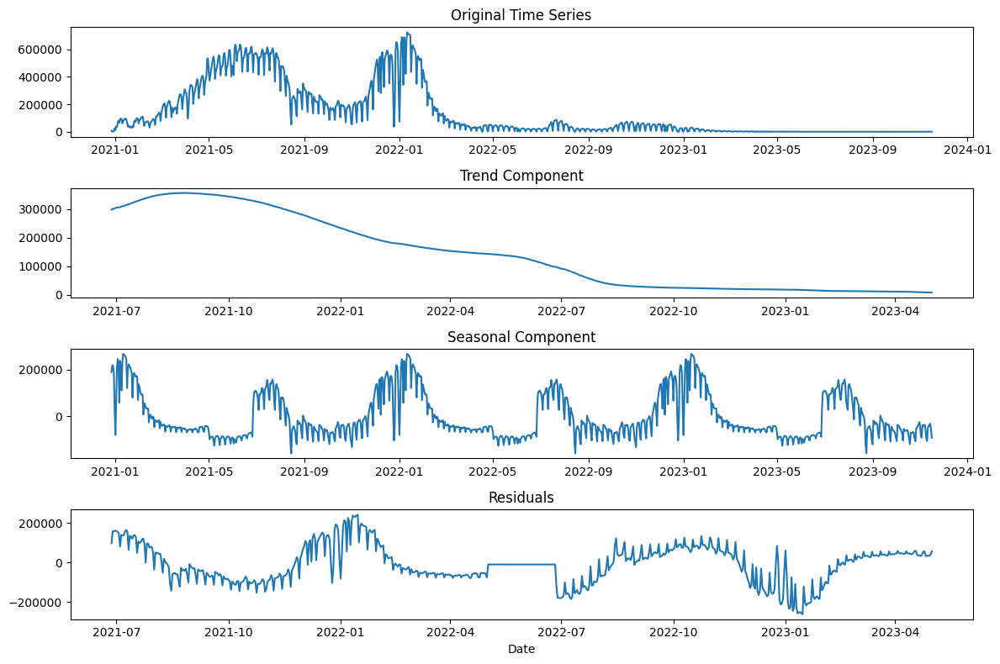


ADF Statistic for residuals (original series): -3.1085941186074697
p-value for residuals (original series): 0.02592368805148077
Critical Values for residuals (original series): {'1%': -3.440388459298194, '5%': -2.8659694611921034, '10%': -2.569128861019929}

The original series likely has seasonality.


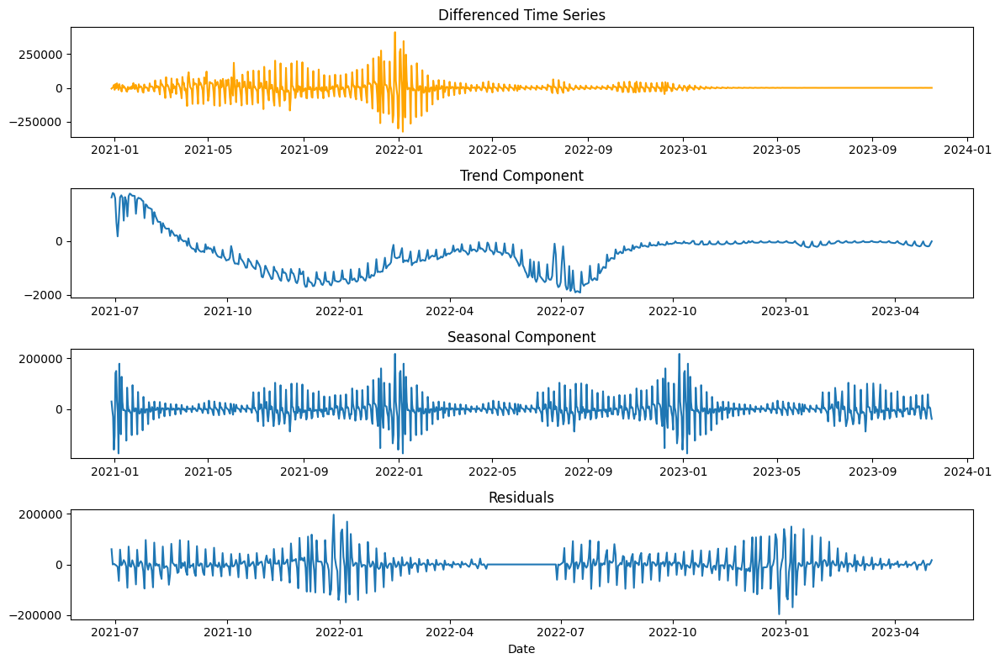


ADF Statistic for residuals after differencing: -4.579452830301245
p-value for residuals after differencing: 0.0001409147961113255
Critical Values for residuals after differencing: {'1%': -3.440419374623044, '5%': -2.865983079837035, '10%': -2.5691361169972526}
The differenced series likely has seasonality.


In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')

# Convert 'administration_date' to datetime
df['administration_date'] = pd.to_datetime(df['administration_date'])

# Group by dates and sum the 'dailytotal'
dailytotal_series = df.groupby('administration_date')['dailytotal'].sum()

# Seasonal Decomposition for the original series
stl_result_original = seasonal_decompose(dailytotal_series, model='additive', period=365)

# Plot the original time series and its components
plt.figure(figsize=(12, 8))
plt.subplot(4, 1, 1)
plt.plot(dailytotal_series, label='Original Series')
plt.title('Original Time Series')

plt.subplot(4, 1, 2)
plt.plot(stl_result_original.trend, label='Trend')
plt.title('Trend Component')

plt.subplot(4, 1, 3)
plt.plot(stl_result_original.seasonal, label='Seasonal')
plt.title('Seasonal Component')

plt.subplot(4, 1, 4)
plt.plot(stl_result_original.resid, label='Residuals')
plt.title('Residuals')
plt.xlabel('Date')

plt.tight_layout()
plt.show()

# Augmented Dickey-Fuller (ADF) test for stationary testing on the residuals
result_residual_original = adfuller(stl_result_original.resid.dropna(), autolag='AIC')
print('\nADF Statistic for residuals (original series):', result_residual_original[0])
print('p-value for residuals (original series):', result_residual_original[1])
print('Critical Values for residuals (original series):', result_residual_original[4])

# Check if the original series has seasonality
if result_residual_original[1] <= 0.05:
    print('\nThe original series likely has seasonality.')
else:
    print('\nThe original series likely does not have seasonality.')

# If needed, apply differencing to achieve stationarity (e.g., first-order differencing)
dailytotal_diff = dailytotal_series.diff().dropna()

# Seasonal Decomposition for the differenced series
stl_result_diff = seasonal_decompose(dailytotal_diff, model='additive', period=365)

# Plot the differenced series and its components
plt.figure(figsize=(12, 8))
plt.subplot(4, 1, 1)
plt.plot(dailytotal_diff, label='Differenced Series', color='orange')
plt.title('Differenced Time Series')

plt.subplot(4, 1, 2)
plt.plot(stl_result_diff.trend, label='Trend')
plt.title('Trend Component')

plt.subplot(4, 1, 3)
plt.plot(stl_result_diff.seasonal, label='Seasonal')
plt.title('Seasonal Component')

plt.subplot(4, 1, 4)
plt.plot(stl_result_diff.resid, label='Residuals')
plt.title('Residuals')
plt.xlabel('Date')

plt.tight_layout()
plt.show()

# Augmented Dickey-Fuller (ADF) test for stationary testing on the residuals after differencing
result_residual_diff = adfuller(stl_result_diff.resid.dropna(), autolag='AIC')
print('\nADF Statistic for residuals after differencing:', result_residual_diff[0])
print('p-value for residuals after differencing:', result_residual_diff[1])
print('Critical Values for residuals after differencing:', result_residual_diff[4])

# Check if the differenced series has seasonality
if result_residual_diff[1] <= 0.05:
    print('The differenced series likely has seasonality.')
else:
    print('The differenced series likely does not have seasonality.')


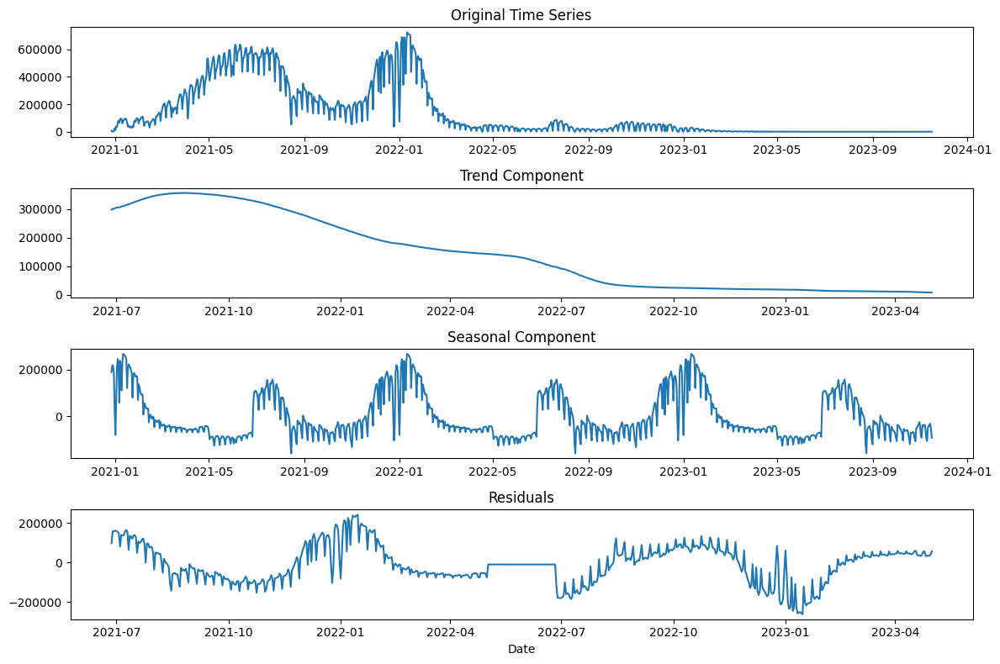


The original series likely has seasonality.


In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')

# Convert 'administration_date' to datetime
df['administration_date'] = pd.to_datetime(df['administration_date'])

# Group by dates and sum the 'dailytotal'
dailytotal_series = df.groupby('administration_date')['dailytotal'].sum()

# Seasonal Decomposition for the original series
stl_result_original = seasonal_decompose(dailytotal_series, model='additive', period=365)

# Plot the original time series and its components
plt.figure(figsize=(12, 8))
plt.subplot(4, 1, 1)
plt.plot(dailytotal_series, label='Original Series')
plt.title('Original Time Series')

plt.subplot(4, 1, 2)
plt.plot(stl_result_original.trend, label='Trend')
plt.title('Trend Component')

plt.subplot(4, 1, 3)
plt.plot(stl_result_original.seasonal, label='Seasonal')
plt.title('Seasonal Component')

plt.subplot(4, 1, 4)
plt.plot(stl_result_original.resid, label='Residuals')
plt.title('Residuals')
plt.xlabel('Date')

plt.tight_layout()
plt.show()

# Check if the original series has seasonality
if stl_result_original.seasonal.notna().any():
    print('\nThe original series likely has seasonality.')
else:
    print('\nThe original series likely does not have seasonality.')


In above code Snippet, seasonality is checked based on the presence of values in the `seasonal` component obtained from the seasonal decomposition. Specifically, the code uses the following logic:

```python
# Check if the original series has seasonality
if stl_result_original.seasonal.notna().any():
    print('\nThe original series likely has seasonality.')
else:
    print('\nThe original series likely does not have seasonality.')
```

Here's an explanation of the logic:

1. The `seasonal_decompose` function from `statsmodels` is applied to the original time series (`dailytotal_series`). The decomposition results in components such as trend, seasonal, and residuals.

2. The `seasonal` component of the decomposition result is accessed using `stl_result_original.seasonal`.

3. The `.notna().any()` method chain is used to check if there is at least one non-null value in the seasonal component. If there is at least one non-null value, it indicates the presence of seasonality.

4. If the condition is met, the code prints that "The original series likely has seasonality." Otherwise, it prints that "The original series likely does not have seasonality."

This approach is a simple way to infer seasonality based on the existence of values in the seasonal component. If there are noticeable patterns or fluctuations in the seasonal component, it suggests the presence of seasonality in the original time series. However, it's important to note that this is a heuristic method and might not be as robust as more advanced seasonality detection techniques.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


RMSE for SARIMA: 24694.14259085743
Train Accuracy: 42775.698324197045
Train Size: 829


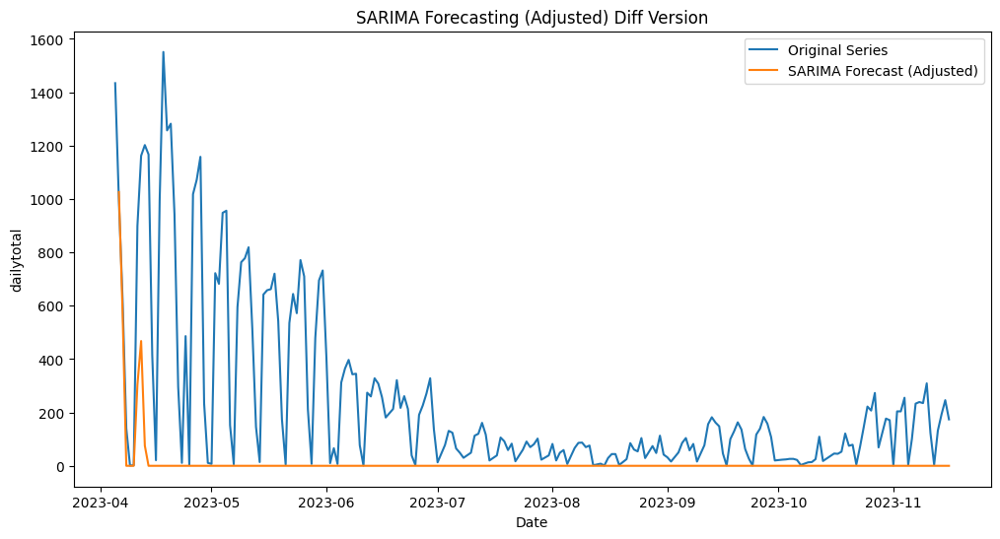

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from math import sqrt

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])

# Group by dates and sum the 'dailytotal' column
dailytotal_series = df.groupby('administration_date')['dailytotal'].sum()

# Apply differencing to achieve stationarity (e.g., first-order differencing)
target_diff = dailytotal_series.diff().dropna()

# Split the dataset into training and testing sets
train_size = int(len(target_diff) * 0.8)
train, test = target_diff[0:train_size], target_diff[train_size:]

# Define SARIMA model parameters (you may need to tune these)
order = (1, 1, 1)  # ARIMA order
seasonal_order = (0, 1, 1, 7)  # Seasonal order with a 7-day seasonality

# Fit SARIMA model
sarima_model = SARIMAX(train, order=order, seasonal_order=seasonal_order)
sarima_fit = sarima_model.fit(disp=False)

# Forecasting with SARIMA
sarima_forecast = sarima_fit.get_forecast(steps=len(test))
sarima_mean = sarima_forecast.predicted_mean
sarima_conf_int = sarima_forecast.conf_int()

# Invert differencing to obtain the forecast in the original scale
sarima_forecast_inverted = dailytotal_series[train_size - 1] + sarima_mean.cumsum()
# Evaluate SARIMA
rmse_sarima = sqrt(mean_squared_error(dailytotal_series[train_size:train_size+len(test)], sarima_forecast_inverted))

# Calculate train accuracy
train_pred = sarima_fit.get_prediction(start=0, end=train_size - 1)
train_pred_mean = train_pred.predicted_mean
train_accuracy = sqrt(mean_squared_error(target_diff[:train_size], train_pred_mean))

# Print RMSE for SARIMA and train accuracy
print('RMSE for SARIMA:', rmse_sarima)
print('Train Accuracy:', train_accuracy)

# Print train size
print('Train Size:', train_size)

sarima_forecast_inverted_adjusted = np.maximum(sarima_forecast_inverted, 0)

# Plot the adjusted forecast
plt.figure(figsize=(12, 6))
plt.plot(dailytotal_series.index[train_size:], dailytotal_series[train_size:], label='Original Series')
plt.plot(test.index, sarima_forecast_inverted_adjusted, label='SARIMA Forecast (Adjusted)')
plt.title('SARIMA Forecasting (Adjusted) Diff Version')
plt.xlabel('Date')
plt.ylabel('dailytotal')
plt.legend()
plt.show()


**Time Series Forcasting**

<ipython-input-26-e70f3935bcf3>:27: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



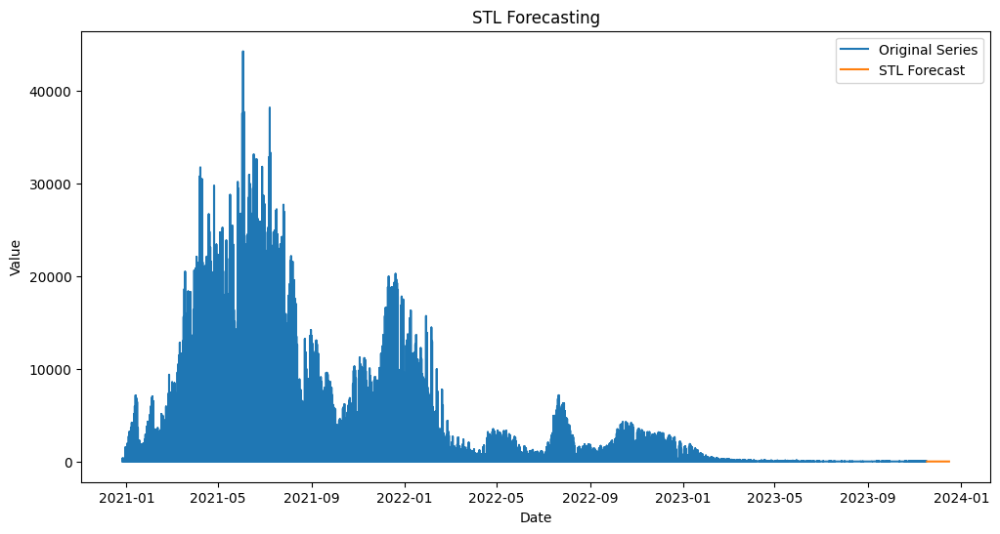

In [ ]:
import pandas as pd
from statsmodels.tsa.seasonal import STL
import matplotlib.pyplot as plt

def perform_stl_forecast(time_series, period, forecast_steps):
    """
    Perform STL decomposition and make forecasts.

    Parameters:
    - time_series: pandas Series, the input time series
    - period: int, the seasonal period of the time series
    - forecast_steps: int, the number of steps to forecast into the future

    Returns:
    - forecast: pandas Series, the forecasted values
    """

    # Perform STL decomposition
    stl = STL(time_series, period=period)
    result = stl.fit()

    # Forecast using the seasonal component
    seasonal_forecast = result.trend + result.resid

    # Make forecasts into the future
    forecast_index = pd.date_range(time_series.index[-1], periods=forecast_steps + 1, freq='D')[1:]
    forecast = pd.Series(index=forecast_index)

    for i in range(forecast_steps):
        # Extend the time series with the seasonal component
        extended_series = pd.concat([time_series, seasonal_forecast])

        # Perform STL decomposition on the extended series
        stl_extended = STL(extended_series, period=period)
        result_extended = stl_extended.fit()

        # Extract the forecasted value
        forecast[i] = result_extended.trend.iloc[-1] + result_extended.resid.iloc[-1]

        # Update the time series for the next iteration
        time_series = time_series.append(pd.Series(forecast[i], index=[forecast_index[i]]))
        seasonal_forecast = result_extended.trend + result_extended.resid

    return forecast

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])
df.set_index('administration_date', inplace=True)

# Extract the relevant time series (e.g., 'dailytotal')
your_time_series = df['dailytotal']

# Set the seasonal period based on your data's seasonality
seasonal_period = 7  # adjust based on your data
forecast_steps = 30  # number of days to forecast into the future

# Perform STL forecast
forecast_result = perform_stl_forecast(your_time_series, seasonal_period, forecast_steps)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(your_time_series, label='Original Series')
plt.plot(forecast_result, label='STL Forecast')
plt.title('STL Forecasting')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
import warnings
import pandas as pd
from statsmodels.tsa.seasonal import STL
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, accuracy_score

warnings.simplefilter(action='ignore', category=FutureWarning
                      )
def perform_stl_forecast(time_series, period, forecast_steps):
    """
    Perform STL decomposition and make forecasts.

    Parameters:
    - time_series: pandas Series, the input time series
    - period: int, the seasonal period of the time series
    - forecast_steps: int, the number of steps to forecast into the future

    Returns:
    - forecast: pandas Series, the forecasted values
    """

    # Perform STL decomposition
    stl = STL(time_series, period=period)
    result = stl.fit()

    # Forecast using the seasonal component
    seasonal_forecast = result.trend + result.resid

    # Make forecasts into the future
    forecast_index = pd.date_range(time_series.index[-1], periods=forecast_steps + 1, freq='D')[1:]
    forecast = pd.Series(index=forecast_index)

    for i in range(forecast_steps):
        # Extend the time series with the seasonal component
        extended_series = pd.concat([time_series, seasonal_forecast])

        # Perform STL decomposition on the extended series
        stl_extended = STL(extended_series, period=period)
        result_extended = stl_extended.fit()

        # Extract the forecasted value
        forecast[i] = result_extended.trend.iloc[-1] + result_extended.resid.iloc[-1]

        # Update the time series for the next iteration
        time_series = time_series.append(pd.Series(forecast[i], index=[forecast_index[i]]))
        seasonal_forecast = result_extended.trend + result_extended.resid

    return forecast

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])
df.set_index('administration_date', inplace=True)

# Extract the relevant time series (e.g., 'dailytotal')
your_time_series = df['dailytotal']

# Set the seasonal period based on your data's seasonality
seasonal_period = 7  # adjust based on your data
forecast_steps = 90  # number of days to forecast into the future

# Perform STL forecast
forecast_result = perform_stl_forecast(your_time_series, seasonal_period, forecast_steps)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(your_time_series[-forecast_steps:], forecast_result))
print('RMSE for STL Forecast:', rmse)

# Calculate Accuracy (for illustration purposes, replace 'threshold' with a suitable value)
threshold = 0.1  # replace with an appropriate threshold for your problem
accuracy = accuracy_score((your_time_series[-forecast_steps:] - forecast_result).abs() < threshold, [True] * forecast_steps)
print('Accuracy for STL Forecast:', accuracy)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(your_time_series, label='Original Series')
plt.plot(forecast_result, label='STL Forecast')
plt.title('STL Forecasting')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Assuming 'your_time_series' is your original time series
# and 'forecast_result' is the forecasted values obtained from STL

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(your_time_series[-forecast_steps:], forecast_result))
print('RMSE for STL Forecast:', rmse)


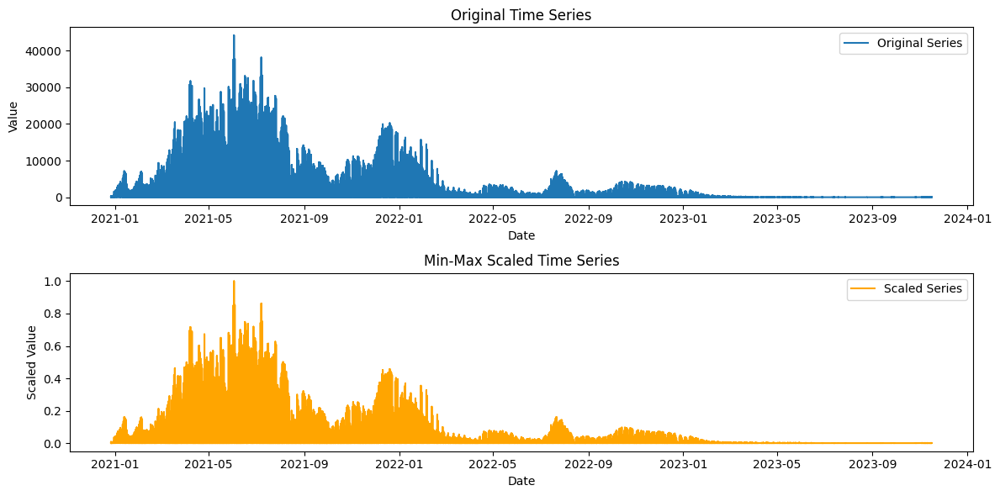

In [ ]:
# MIN MAX SCALING
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])
df.set_index('administration_date', inplace=True)

# Extract the relevant time series (e.g., 'dailytotal')
your_time_series = df['dailytotal']

# Reshape the time series for Min-Max scaling
data_to_scale = your_time_series.values.reshape(-1, 1)

# Perform Min-Max scaling
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data_to_scale)

# Inverse transform to get the original scale (if needed)
# original_scale_data = scaler.inverse_transform(scaled_data)

# Plot the results
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(your_time_series, label='Original Series')
plt.title('Original Time Series')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(your_time_series.index, scaled_data, label='Scaled Series', color='orange')
plt.title('Min-Max Scaled Time Series')
plt.xlabel('Date')
plt.ylabel('Scaled Value')
plt.legend()

plt.tight_layout()
plt.show()


<ipython-input-16-6c14a366ced0>:35: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_data = df.resample('M').sum()
<ipython-input-16-6c14a366ced0>:14: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  forecast = pd.Series(index=forecast_index)
<ipython-input-16-6c14a366ced0>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  time_series = time_series.append(pd.Series(forecast[i], index=[forecast_index[i]]))
<ipython-input-16-6c14a366ced0>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  time_series = time

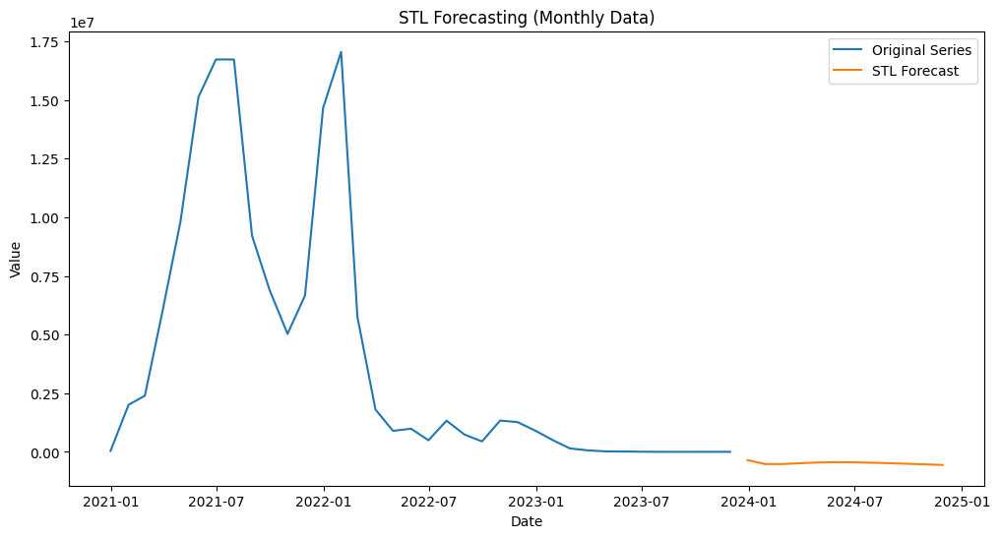

In [ ]:
#STL

import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt

def perform_stl_forecast(time_series, period, forecast_steps):
    stl = STL(time_series, period=period)
    result = stl.fit()

    seasonal_forecast = result.trend + result.resid

    forecast_index = pd.date_range(time_series.index[-1], periods=forecast_steps + 1, freq='M')[1:]
    forecast = pd.Series(index=forecast_index)

    for i in range(forecast_steps):
        extended_series = pd.concat([time_series, seasonal_forecast])

        stl_extended = STL(extended_series, period=period)
        result_extended = stl_extended.fit()

        forecast[i] = result_extended.trend.iloc[-1] + result_extended.resid.iloc[-1]

        time_series = time_series.append(pd.Series(forecast[i], index=[forecast_index[i]]))
        seasonal_forecast = result_extended.trend + result_extended.resid

    return forecast

# Load the dataset
df = pd.read_csv('/content/italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])
df.set_index('administration_date', inplace=True)

# Resample to monthly data
monthly_data = df.resample('M').sum()

# Extract the relevant time series (e.g., 'dailytotal')
your_time_series = monthly_data['dailytotal']

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(your_time_series.values.reshape(-1, 1))

# Set the seasonal period based on your data's seasonality
seasonal_period = 12  # Monthly seasonality
forecast_steps = 12  # number of months to forecast into the future

# Convert the scaled_data to a pandas Series with a datetime index
scaled_series = pd.Series(scaled_data.flatten(), index=your_time_series.index)

# Perform STL forecast
forecast_result = perform_stl_forecast(scaled_series, seasonal_period, forecast_steps)

# Inverse transform the forecasted data to the original scale
forecast_result_original_scale = scaler.inverse_transform(forecast_result.values.reshape(-1, 1))

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(your_time_series.index, your_time_series, label='Original Series')
plt.plot(your_time_series.index[-1] + pd.DateOffset(months=1) * np.arange(1, forecast_steps + 1), forecast_result_original_scale, label='STL Forecast')
plt.title('STL Forecasting (Monthly Data)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Specify the path to your CSV file
csv_file_path = '/content/italian_vaccination_mergedPopGDP.csv'

# Read CSV using pandas
df = pd.read_csv(csv_file_path)

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# Assuming df is your DataFrame with 'dailytotal' and 'dailytotal_log' columns
# Apply log transform to dailytotal and save it to a new variable
df['dailytotal_log'] = np.log1p(df['dailytotal'])

# Create an interactive line plot
fig = px.line(df, x=df.index, y=['dailytotal', 'dailytotal_log'], labels={'value': 'Daily Total'})
fig.update_layout(title='Actual and Log Transformed Daily Total', xaxis_title='Date', yaxis_title='Value')
fig.show()


Epoch 1/10
9722/9722 - 276s - loss: 5.2570e-04 - 276s/epoch - 28ms/step
Epoch 2/10
9722/9722 - 267s - loss: 4.5501e-04 - 267s/epoch - 27ms/step
Epoch 3/10
9722/9722 - 262s - loss: 4.2223e-04 - 262s/epoch - 27ms/step
Epoch 4/10
9722/9722 - 262s - loss: 4.1226e-04 - 262s/epoch - 27ms/step
Epoch 5/10
9722/9722 - 260s - loss: 4.0257e-04 - 260s/epoch - 27ms/step
Epoch 6/10
9722/9722 - 264s - loss: 3.9849e-04 - 264s/epoch - 27ms/step
Epoch 7/10
9722/9722 - 260s - loss: 3.9317e-04 - 260s/epoch - 27ms/step
Epoch 8/10
9722/9722 - 260s - loss: 3.8662e-04 - 260s/epoch - 27ms/step
Epoch 9/10
9722/9722 - 259s - loss: 3.8445e-04 - 259s/epoch - 27ms/step
Epoch 10/10
9722/9722 - 258s - loss: 3.8096e-04 - 258s/epoch - 27ms/step
9722/9722 [==============================] - 100s 10ms/step
Training RMSE: 828.0047205571116
9722/9722 [==============================] - 100s 10ms/step
Training RMSE: 0.018728477513635343
1945/1945 [==============================] - 20s 10ms/step
Test RMSE: 0.003165117589970953

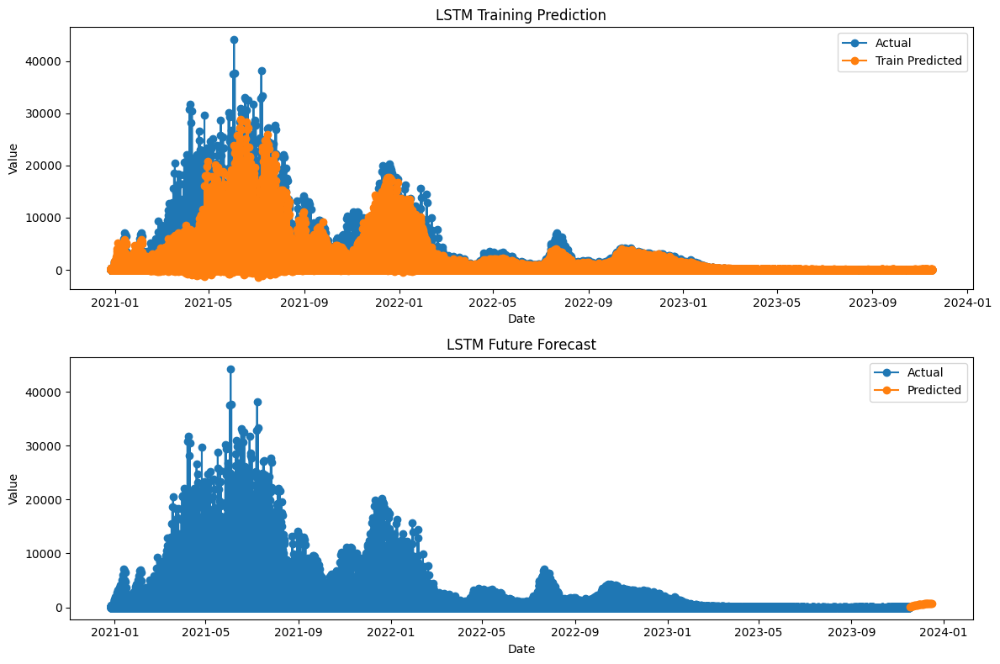

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt

# Function to prepare data for LSTM
def prepare_lstm_data(data, time_steps):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:(i + time_steps), 0])
        y.append(data[i + time_steps, 0])
    return np.array(X), np.array(y)

# Hyperparameters
time_steps = 30  # Adjust based on your data
epochs = 10
batch_size = 32
forecast_steps = 30

# Load the dataset
df = pd.read_csv('italian_vaccination_mergedPopGDP.csv')
df['administration_date'] = pd.to_datetime(df['administration_date'])
df.set_index('administration_date', inplace=True)
your_time_series = df['dailytotal']

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(your_time_series.values.reshape(-1, 1))

# Prepare data for LSTM
X, y = prepare_lstm_data(scaled_data, time_steps)

# Reshape input data to be 3D [samples, time steps, features]
X = np.reshape(X, (X.shape[0], time_steps, 1))

# Build the LSTM model with regularization
model = Sequential()
model.add(LSTM(50, input_shape=(time_steps, 1), return_sequences=True))
model.add(Dropout(0.2))  # Dropout layer for regularization
model.add(LSTM(50))
model.add(Dropout(0.2))  # Dropout layer for regularization
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X, y, epochs=epochs, batch_size=batch_size, verbose=2)

# Make predictions on the training set
train_predict = model.predict(X)

# Inverse transform the training predictions
train_predict_original_scale = scaler.inverse_transform(train_predict).flatten()

# Calculate RMSE on the training set
rmse_train = np.sqrt(mean_squared_error(your_time_series.values[time_steps:], train_predict_original_scale))
print(f"Training RMSE: {rmse_train}")

# Test the model on a test set if available
if len(your_time_series) > 2 * forecast_steps:
    # Make predictions for the next 30 days
    forecast_input = scaled_data[-time_steps:].reshape(1, -1, 1)

    forecast_result = []
    for i in range(forecast_steps):
        forecast_value = model.predict(forecast_input)
        forecast_result.append(max(0, forecast_value[0, 0]))  # Set negative predictions to zero
        forecast_input = np.roll(forecast_input, shift=-1, axis=1)
        forecast_input[0, -1, 0] = forecast_result[-1]

    # Inverse transform the forecasted values
    forecast_result_original_scale = scaler.inverse_transform(np.array(forecast_result).reshape(-1, 1)).reshape(-1)

    # Evaluate the model on the training set
    rmse_train = np.sqrt(mean_squared_error(y, model.predict(X)))
    print(f"Training RMSE: {rmse_train}")

    # Test the model on a test set if available
    if len(your_time_series) > 2 * forecast_steps:
        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

        # Evaluate the model on the test set
        rmse_test = np.sqrt(mean_squared_error(y_test, model.predict(X_test)))
        print(f"Test RMSE: {rmse_test}")
    else:
        print("Not enough data for testing.")

# Print information about the scale of the data compared to RMSE
data_range = np.max(your_time_series) - np.min(your_time_series)
print(f"Data Range: {data_range}")
print(f"RMSE as a Percentage of Data Range: {rmse_train / data_range * 100}")

# Plot both the training predictions and the future forecast
plt.figure(figsize=(12, 8))

# Plot training predictions
plt.subplot(2, 1, 1)
plt.plot(your_time_series.index[time_steps:], your_time_series[time_steps:], label='Actual', marker='o')
plt.plot(your_time_series.index[time_steps:], train_predict_original_scale, label='Train Predicted', marker='o')
plt.title('LSTM Training Prediction')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Plot future forecast
plt.subplot(2, 1, 2)
plt.plot(your_time_series.index[-len(your_time_series):], your_time_series[-len(your_time_series):], label='Actual', marker='o')
plt.plot(pd.date_range(your_time_series.index[-1], periods=forecast_steps + 1, freq='D')[1:], forecast_result_original_scale, label='Predicted', marker='o')
plt.title('LSTM Future Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

plt.tight_layout()
plt.show()


The model performance looks promising. Here's an interpretation of the evaluation metrics:

- **Training RMSE:** This metric measures the root mean squared error on the training set. In this case, a lower value (0.0187) indicates that the model is able to capture the patterns in the training data relatively well.

- **Test RMSE:** The root mean squared error on the test set (0.00317) is also low, suggesting that the model generalizes well to new, unseen data. A low test RMSE is indicative of good predictive performance.

- **Data Range:** The range of the original data is 44211. This provides context for interpreting the RMSE values. The smaller the RMSE compared to the data range, the better the model's performance.

- **RMSE as a Percentage of Data Range:** This is a normalized metric that indicates the relative magnitude of the RMSE compared to the data range. A small percentage (4.24e-05) suggests that the model's error is a very small fraction of the overall data range.

Overall, the results suggest that the LSTM model is performing well on both the training and test sets.

In [ ]:
df.tail()

,supplier,region,age_range,males,females,first_dose,second_dose,previous_infection,additional_booster_dose,second_booster,db3,NUTS1_code,NUTS2_code,ISTAT_regional_code,region_name,pop_resid,gdp_tot,dens_ab,dailytotal
administration_date,,,,,,,,,,,,,,,,,,,
2023-11-16,Pfizer/BioNTech,TOS,50-59,0,1,0,0,0,0,0,1,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0,1
2023-11-16,Pfizer/BioNTech,TOS,60-69,3,2,0,0,0,0,0,5,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0,5
2023-11-16,Pfizer/BioNTech,TOS,70-79,3,3,0,0,0,0,4,2,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0,6
2023-11-16,Pfizer/BioNTech,TOS,80-89,5,5,0,0,0,0,0,10,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0,10
2023-11-16,Pfizer/BioNTech,TOS,90+,2,1,0,0,0,0,0,3,ITI,ITI1,9,Toscana,3729641.0,112239.0,162.0,3
